<a href="https://colab.research.google.com/github/duonghung86/GAN-Generative-Adversarial-Networks/blob/main/TF_VanillaGAN_quadratic_function.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Vanilla Generative Adversarial Network for quadratic function

## What are GANs?
[Generative Adversarial Networks](https://arxiv.org/abs/1406.2661) (GANs) are one of the most interesting ideas in computer science today. Two models are trained simultaneously by an adversarial process. A *generator* ("the artist") learns to create images that look real, while a *discriminator* ("the art critic") learns to tell real images apart from fakes.

![A diagram of a generator and discriminator](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gan1.png?raw=1)

During training, the *generator* progressively becomes better at creating images that look real, while the *discriminator* becomes better at telling them apart. The process reaches equilibrium when the *discriminator* can no longer distinguish real images from fakes.

![A second diagram of a generator and discriminator](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gan2.png?raw=1)

This notebook demonstrates this process on the MNIST dataset. The following animation shows a series of images produced by the *generator* as it was trained for 50 epochs. The images begin as random noise, and increasingly resemble hand written digits over time.

![sample output](https://tensorflow.org/images/gan/dcgan.gif)

To learn more about GANs, we recommend MIT's [Intro to Deep Learning](http://introtodeeplearning.com/) course.

### Setup

In [ ]:
import tensorflow as tf

In [ ]:
tf.__version__

'2.4.1'

In [ ]:
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
from tensorflow.keras import layers
import time

from IPython import display

### Load and prepare the dataset

$y = x^2$

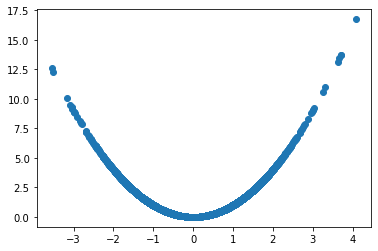

array([[ 1.78862847e+00,  3.19919182e+00],
       [ 4.36509851e-01,  1.90540850e-01],
       [ 9.64974681e-02,  9.31176134e-03],
       [-1.86349270e+00,  3.47260506e+00],
       [-2.77388203e-01,  7.69442149e-02],
       [-3.54758979e-01,  1.25853933e-01],
       [-8.27414815e-02,  6.84615276e-03],
       [-6.27000677e-01,  3.93129849e-01],
       [-4.38181690e-02,  1.92003193e-03],
       [-4.77218030e-01,  2.27737049e-01]])

In [ ]:
N = 6000 
np.random.seed(3)
X = np.random.normal(size = (6000,1))
X = np.hstack((X,X**2))
plt.scatter(X[:,0],X[:,1])
plt.show()
X[:10,:]

In [ ]:
X.std(1)

array([0.70528167, 0.1229845 , 0.04359285, ..., 1.9823242 , 0.09098015,
       1.14195881])

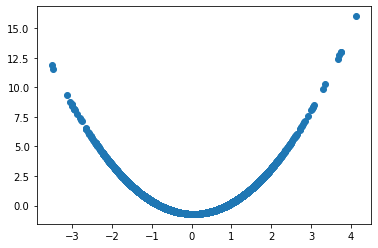

In [ ]:
stand_X = X-X.mean(0)/X.std(0)
plt.scatter(stand_X[:,0],stand_X[:,1])
plt.show()

In [ ]:
BUFFER_SIZE = N
BATCH_SIZE = 256

In [ ]:
# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(X).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

## Create the models

Both the generator and discriminator are defined using the [Keras Sequential API](https://www.tensorflow.org/guide/keras#sequential_model).

### The Generator

The generator uses a full connected layers to produce an sample from a seed (random noise). Notice the `relu` activation for the full connected layer, except the output layer which uses tanh.

In [ ]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(20, activation='relu', input_shape=(100,)))
    model.add(layers.Dense(2,activation='tanh'))
    return model

Use the (as yet untrained) generator to create an image.

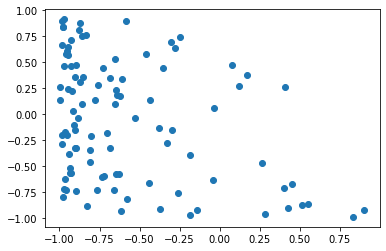

In [ ]:
generator = make_generator_model()

noise = tf.random.normal([100, 100])
gen_X = generator(noise, training=False)

plt.scatter(gen_X[:,0],gen_X[:,1])

### The Discriminator

The discriminator has similar structure with generator.

In [ ]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(20, activation='relu', input_shape=(2,)))
    model.add(layers.Dense(1,activation='sigmoid'))

    return model

Use the (as yet untrained) discriminator to classify the generated samples as real or fake. The model will be trained to output positive values for real samples, and negative values for fake samples.

In [ ]:
discriminator = make_discriminator_model()
decision = discriminator(gen_X)
print (decision)

tf.Tensor(
[[0.5252711 ]
 [0.5612236 ]
 [0.51549315]
 [0.5015583 ]
 [0.5348931 ]
 [0.57886124]
 [0.5818662 ]
 [0.5024663 ]
 [0.5496185 ]
 [0.5063797 ]
 [0.5312228 ]
 [0.5469211 ]
 [0.55104315]
 [0.5020586 ]
 [0.5240904 ]
 [0.5164589 ]
 [0.5161337 ]
 [0.5067531 ]
 [0.51403296]
 [0.5014569 ]
 [0.5367512 ]
 [0.5851944 ]
 [0.5173716 ]
 [0.50175923]
 [0.5478382 ]
 [0.52116555]
 [0.51244116]
 [0.50183696]
 [0.57743037]
 [0.50661796]
 [0.5169203 ]
 [0.5935096 ]
 [0.5880374 ]
 [0.5177318 ]
 [0.5015099 ]
 [0.52594936]
 [0.50280976]
 [0.51011854]
 [0.55994093]
 [0.5265062 ]
 [0.51489866]
 [0.51651925]
 [0.5028831 ]
 [0.51516074]
 [0.50340325]
 [0.5793944 ]
 [0.56442684]
 [0.5032539 ]
 [0.501314  ]
 [0.54683393]
 [0.51610047]
 [0.52226233]
 [0.50917447]
 [0.5324122 ]
 [0.5116753 ]
 [0.5677062 ]
 [0.50270104]
 [0.5267105 ]
 [0.5052455 ]
 [0.5544039 ]
 [0.5158803 ]
 [0.5867753 ]
 [0.54673374]
 [0.502762  ]
 [0.5154174 ]
 [0.57376903]
 [0.5076164 ]
 [0.55782557]
 [0.52009875]
 [0.5182407 ]
 [0.52104

## Define the loss and optimizers

Define loss functions and optimizers for both models.


In [ ]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### Discriminator loss

This method quantifies how well the discriminator is able to distinguish real samples from fakes. It compares the discriminator's predictions on real samples to an array of 1s, and the discriminator's predictions on fake (generated) samples to an array of 0s.

In [ ]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

### Generator loss
The generator's loss quantifies how well it was able to trick the discriminator. Intuitively, if the generator is performing well, the discriminator will classify the fake sample as real (or 1). Here, we will compare the discriminators decisions on the generated samples to an array of 1s.

In [ ]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

The discriminator and the generator optimizers are different since we will train two networks separately.

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

### Save checkpoints
This notebook also demonstrates how to save and restore models, which can be helpful in case a long running training task is interrupted.

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Define the training loop


In [ ]:
EPOCHS = 800
noise_dim = 100
num_examples_to_generate = 100

# We will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, noise_dim])

The training loop begins with generator receiving a random seed as input. That seed is used to produce an sample. The discriminator is then used to classify real samples (drawn from the training set) and fakes samples (produced by the generator). The loss is calculated for each of these models, and the gradients are used to update the generator and discriminator.

In [ ]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [ ]:
def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
      train_step(image_batch)

    # Produce images for the GIF as we go
    display.clear_output(wait=True)
    generate_and_save_images(generator,
                             epoch + 1,
                             seed)

    # Save the model every 15 epochs
    if (epoch + 1) % 20 == 0:
      checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

  # Generate after the final epoch
  display.clear_output(wait=True)
  generate_and_save_images(generator,
                           epochs,
                           seed)

**Generate and save images**


In [ ]:
def generate_and_save_images(model, epoch, test_input):
  # Notice `training` is set to False.
  # This is so all layers run in inference mode (batchnorm).
  predictions = model(test_input, training=False)
  print(predictions.shape)
  fig = plt.figure(figsize=(4,4))

  plt.scatter(predictions[:,0],predictions[:,1])
  plt.title('Epoch = {} '.format(epoch + 1))
  plt.savefig('Animation/image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

## Train the model
Call the `train()` method defined above to train the generator and discriminator simultaneously. Note, training GANs can be tricky. It's important that the generator and discriminator do not overpower each other (e.g., that they train at a similar rate).

At the beginning of the training, the generated images look like random noise. As training progresses, the generated digits will look increasingly real. 

All generated plot will be store in the folder Animation

In [ ]:
!rm -r Animation

In [ ]:
!mkdir Animation

(100, 2)


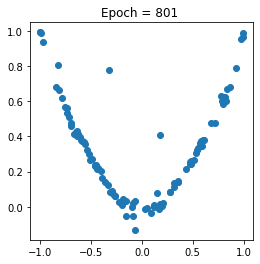

In [ ]:
train(train_dataset, EPOCHS)

Restore the latest checkpoint.

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

## Create a GIF


In [ ]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('Animation/image_at_epoch_{:04d}.png'.format(epoch_no))

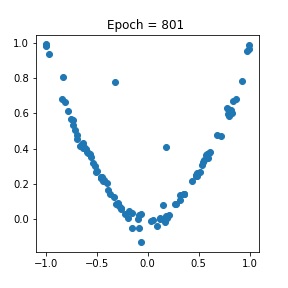

In [ ]:
display_image(EPOCHS)

Use `imageio` to create an animated gif using the images saved during training.

In [ ]:
anim_file = 'vanillagan_quadratic_function.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('Animation/image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)


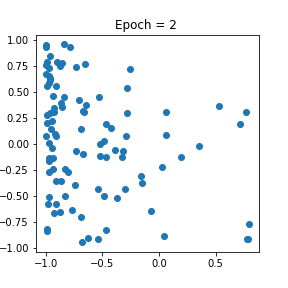

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)